# Проектная работа
# Рынок заведений общественного питания Москвы

**Описание**\
Я работаю на заказчиков-инвесторов из фонда «Shut Up and Take My Money», которые хотят открыть заведение общественного питания в Москве.
<br>
<br>

 **Цель исследования**\
Подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
<br>
<br>

 **Описание данных**\
Датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.
<br>
<br>

**План исследования:**
1) открыть файл с данными и изучить общую информацию;\
2) выполнить предобработку данных, добавить столбец с названиями улиц и столбец с обозначением, что заведение работает ежедневно и круглосуточно (24/7);\
3) провести исследовательский анализ данных;\
4) детализировать исследование с точки зрения открытия кофейни;\
5) подготовить презентацию;\
6) сделать общий вывод.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import plotly.express as px
import seaborn as sns
import json
from folium import Map, Choropleth, GeoJsonTooltip,  GeoJson
# импортируем модуль re для приведения всех названий в обработке данных к одному виду и очищения от лишних символов
import re
# импортируем карту и маркер
from folium import Marker
# импортируем кластер
from folium.plugins import MarkerCluster

### Загрузка данных

In [2]:
# сохраняем датафрейм
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
display(data.head(50))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В датасете представлены данные о 8406 заведениях.\
Есть пропуски в столбцах hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.\
Типы данных менять необходимости нет, также нет необходимости переименовывать столбцы.\

Столбцы содержат информацию о характеристиках заведений (название, время работы, местоположение, вместимость) и о показателях рейтинга и цен (средний чек, средняя стоимость чашки капучино) и представлены следующими типами данных: object (смешанный/текстовый), float (вещественный), int (целочисленный).

### Предобработка данных

#### Обработка дубликатов

In [5]:
# сохраняем количество строк в датафрейме для дальнейшего расчета доли удаленных данных
len_data = len(data)
print(len_data)

8406


In [6]:
# проверяем датафрейм на явные дубликаты
print(data.duplicated().sum())

0


Явных дубликатов нет.

In [7]:
# проверяем на наличие неявных дубликатов столбец category
print(data['category'].unique())
print()

# проверяем на наличие неявных дубликатов столбец district
print(data['district'].unique())
print()

['кафе' 'ресторан' 'кофейня' 'пиццерия' 'бар,паб' 'быстрое питание'
 'булочная' 'столовая']

['Северный административный округ'
 'Северо-Восточный административный округ'
 'Северо-Западный административный округ'
 'Западный административный округ' 'Центральный административный округ'
 'Восточный административный округ' 'Юго-Восточный административный округ'
 'Южный административный округ' 'Юго-Западный административный округ']



In [8]:
def clean_name(row): 
    return re.sub(r'[^а-яА-ЯёЁa-zA-Z ]', '', row['name']).strip().lower()
data['clean_name'] = data.apply(clean_name, axis=1)

# проверяем на наличие неявных строк-дубликатов, где совпадают название и адрес
duplicates = data[data.duplicated(subset=['clean_name', 'address'], keep=False)]
display(duplicates)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name
599,В парке вкуснее!,кафе,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.854571,37.487254,2.2,NaN,NaN,NaN,NaN,0,NaN,в парке вкуснее
600,В парке вкуснее,кофейня,"Москва, Северный административный округ, район...",Северный административный округ,"ежедневно, 10:00–21:00",55.851985,37.478492,2.2,NaN,NaN,NaN,NaN,1,NaN,в парке вкуснее
1430,More poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0,more poke
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0,more poke
2211,Раковарня Клешни и Хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0,раковарня клешни и хвосты
2420,Раковарня Клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0,раковарня клешни и хвосты
3091,Хлеб да Выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0,хлеб да выпечка
3109,Хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0,хлеб да выпечка
4613,Cafe 13,кафе,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–19:00,55.762779,37.633079,4.3,NaN,NaN,NaN,NaN,0,200.0,cafe
4780,Cafe13,ресторан,"Москва, Мясницкая улица, 13, стр. 11",Центральный административный округ,пн-чт 10:00–22:00; пт 10:00–18:00,55.762748,37.633176,4.3,NaN,NaN,NaN,NaN,0,200.0,cafe


In [9]:
# удалим эти неявные дубликаты, оставив первые упоминания о заведениях
data = data.drop_duplicates(subset=['clean_name', 'address'], keep='first')
# проверяем
display(data[data.duplicated(subset=['clean_name', 'address'], keep=False)])

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name


In [10]:
# сохраняем количество строк в датафрейме для проверки доли удаленных данных
len_data2 = len(data)
deleted = ((len_data - len_data2)/len_data) * 100
print(f'Процент удаленных данных: {deleted:.2f}%')

Процент удаленных данных: 0.06%


Мы удалили 0.06% данных.

#### Обработка пропусков

In [11]:
# проверяем датафрейм на пропуски
print(data.isna().sum())

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5086
avg_bill             4585
middle_avg_bill      5252
middle_coffee_cup    7866
chain                   0
seats                3610
clean_name              0
dtype: int64


Пропуски обнаружены в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats.\
Обработать их не можем, так как во всех столбцах из вышеперечиселенных, кроме hours, пропусков слишком много и заполнить их невозможно без искажения результатов исследования.\
Пропуски в столбце hours удалить нельзя, так как при удалении будет потеряно более 6% данных.\
Оставим пропуски как есть.

#### Создание столбца с названиями улиц 

In [12]:
# создадим столбец street с названиями улиц из столбца с адресом

# функция для извлечения названия улицы
def add_street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street

# применим функцию ко всей таблице
data['street'] = data.apply(add_street, axis=1)

# на 10 рандомных строках посмотрим, как сработала функция
data.sample(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name,street
431,Сакура,ресторан,"Москва, улица Свободы, 48, стр. 1",Северо-Западный административный округ,"пн-чт 11:00–22:45; пт,сб 11:00–23:00; вс 11:00...",55.848400,37.454374,4.3,NaN,NaN,NaN,NaN,1,110.0,сакура,улица Свободы
6413,Додо Пицца,пиццерия,"Москва, Жулебинский бульвар, 15",Юго-Восточный административный округ,"ежедневно, 10:00–23:00",55.695641,37.851583,4.3,NaN,Средний счёт:339 ₽,339.0,NaN,1,40.0,додо пицца,Жулебинский бульвар
7705,Ресторан,ресторан,"Москва, Соловьиный проезд, 6А",Юго-Западный административный округ,NaN,55.615654,37.549747,4.2,NaN,NaN,NaN,NaN,0,NaN,ресторан,Соловьиный проезд
7012,Хочу шашлык,кафе,"Москва, Южный административный округ, район Че...",Южный административный округ,"ежедневно, 10:00–22:00",55.636173,37.596013,4.0,NaN,NaN,NaN,NaN,1,NaN,хочу шашлык,Южный административный округ
3498,Bright Israeli Grill,ресторан,"Москва, Тверская улица, 27, стр. 2",Центральный административный округ,"ежедневно, 12:00–00:00",55.768977,37.596955,4.6,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,100.0,bright israeli grill,Тверская улица
7579,Алло! Пицца,пиццерия,"Москва, Голубинская улица, 28",Юго-Западный административный округ,"ежедневно, 10:00–23:00",55.595287,37.541570,4.3,средние,Средний счёт:600–800 ₽,700.0,NaN,1,55.0,алло пицца,Голубинская улица
4915,Цинандали,ресторан,"Москва, Большая Андроньевская улица, 25/33",Центральный административный округ,"ежедневно, 11:00–23:00",55.739984,37.671988,4.2,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,0,66.0,цинандали,Большая Андроньевская улица
6946,Рыбная мануфактура № 1,кафе,"Москва, улица Архитектора Власова, 47",Юго-Западный административный округ,"ежедневно, 10:00–22:00",55.666234,37.544000,4.3,NaN,NaN,NaN,NaN,1,40.0,рыбная мануфактура,улица Архитектора Власова
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,mr уголёк,Клязьминская улица
1741,Freedom bar,"бар,паб","Москва, Большая Новодмитровская улица, 36, стр. 6",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–02:00; вс 12:00...",55.805880,37.585356,4.5,NaN,NaN,NaN,NaN,0,45.0,freedom bar,Большая Новодмитровская улица


#### Создание столбца с обозначением, что заведение работает ежедневно и круглосуточно (24/7)

In [13]:
# создадим столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7)
data['is_24_7'] = [True if hours == 'ежедневно, круглосуточно' else False for hours in data['hours']]
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name,street,is_24_7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,wowфли,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,четыре комнаты,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,хазри,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,dormouse coffee shop,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,иль марко,Правобережная улица,False


#### Вывод

На этапе предобработки было сделано следующее:
1) явных дубликатов обнаружено не было;\
2) были удалены неявные строки-дубликаты, где совпадают название и адрес (0.06% данных);\
3) пропуски были обнаружены в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Мы оставили их без обработки;\
4) создали столбец street с названиями улиц из столбца с адресом;\
5) создали столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).

### Исследовательский анализ данных

#### Распределение заведений по категориям

In [14]:
# считаем количество заведений по категориям
object_type = data.groupby('category')['category'].count().sort_values(ascending=False)
display(object_type)

category
кафе               2377
ресторан           2041
кофейня            1412
бар,паб             764
пиццерия            633
быстрое питание     603
столовая            315
булочная            256
Name: category, dtype: int64

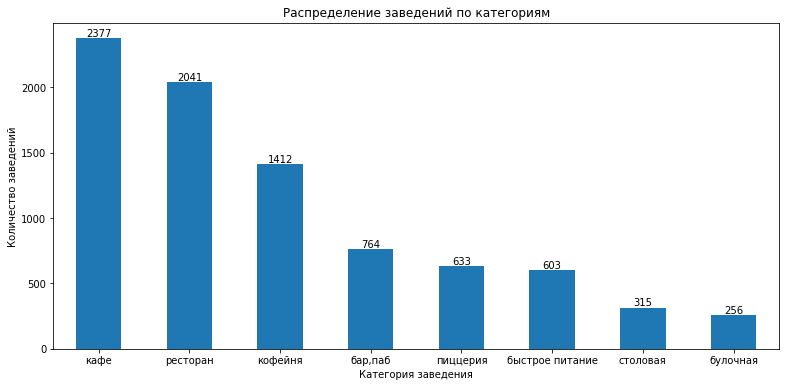

In [15]:
# визуализируем
object_type.plot(kind='bar', figsize=(13, 6))
plt.xticks(rotation=0)
plt.title('Распределение заведений по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
for index, value in enumerate(object_type):
    plt.text(index, value, str(value), ha='center', va='bottom') 
plt.show()

В датасете представлены заведения 8 следующих категорий: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая и булочная.\
В Москве больше всего заведений категории 'кафе' — 2377, а меньше всего булочных — всего 256 штук.

#### Распределение количества посадочных мест в местах по категориям

In [16]:
# считаем количество посадочных мест по категориям заведений
seats_by_category = data.groupby('category')['seats'].median().sort_values(ascending=False)
display(seats_by_category)

category
ресторан           86.0
бар,паб            82.0
кофейня            80.0
столовая           75.5
быстрое питание    65.0
кафе               60.0
пиццерия           55.0
булочная           50.0
Name: seats, dtype: float64

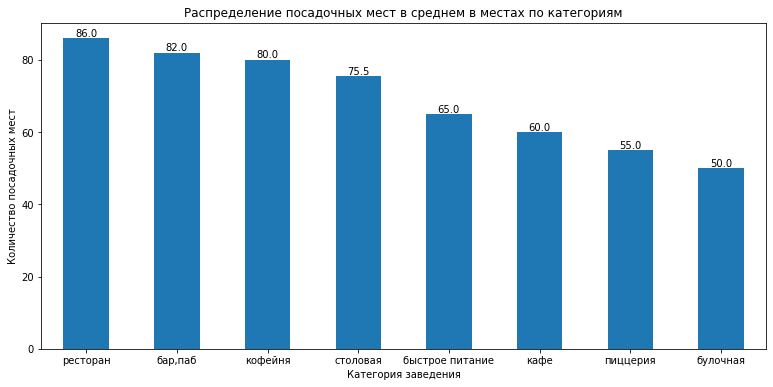

In [17]:
# визуализируем
seats_by_category.plot(kind='bar', figsize=(13, 6))
plt.xticks(rotation=0)
plt.title('Распределение посадочных мест в среднем в местах по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
for index, value in enumerate(seats_by_category):
    plt.text(index, value, str(value), ha='center', va='bottom') 
plt.show()

Больше всего в среднем посадочных мест в заведениях категории "ресторан" - 86. Это связано с тем, что именно в ресторанах проводится большинство мероприятий и празднований с большим количеством гостей. Кроме того, эти заведения пользуются популярностью у людей и привлекают их для ежедневных посещений не только ради приема пищи, но и общения и встреч.\
Меньше всего посадочных мест в среднем в булочных - 50, так как они не предполагают длительного пребывания клиентов, поэтому не нуждаются в большом количестве мест.

#### Соотношение сетевых и несетевых заведений в датасете

In [18]:
# считаем количество заведений по отношению их к сети
chain_group = data.groupby('chain')['chain'].count().sort_values(ascending=False)
# переименуем категории на сетевое/не сетевое для удобства
chain_group.index = chain_group.index.astype(str)
chain_group.rename(index={'0': 'не сетевое', '1': 'сетевое'}, inplace=True)
display(chain_group)

chain
не сетевое    5199
сетевое       3202
Name: chain, dtype: int64

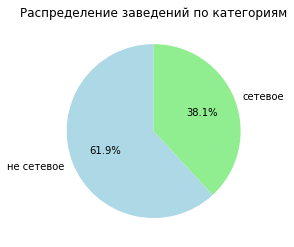

In [19]:
# визуализируем
plt.figure(figsize=(4, 4))
plt.pie(chain_group, labels=chain_group.index, autopct='%1.1f%%', startangle=90, colors=['lightblue', 'lightgreen'])
plt.title('Распределение заведений по категориям')
plt.show()

Больше всего заведений не сетевых - 5199 или 61.9% от общего количества заведений в датасете.\
Сетевых заведений же 3202, что составляет 38.1% от общего количества.

#### Какие категории заведений чаще являются сетевыми? 

In [20]:
# меняем тип данных столбца chain и заменяем значения на более понятные
data['chain'] = data['chain'].astype(str)
data['chain'] = data['chain'].replace({'0': 'не сетевое', '1': 'сетевое'})
# считаем количество заведений по категории и наличию сети
category_by_chain_group = data.pivot_table(index='category', columns='chain', values='name', aggfunc='count')\
.sort_values(by='сетевое', ascending=False)

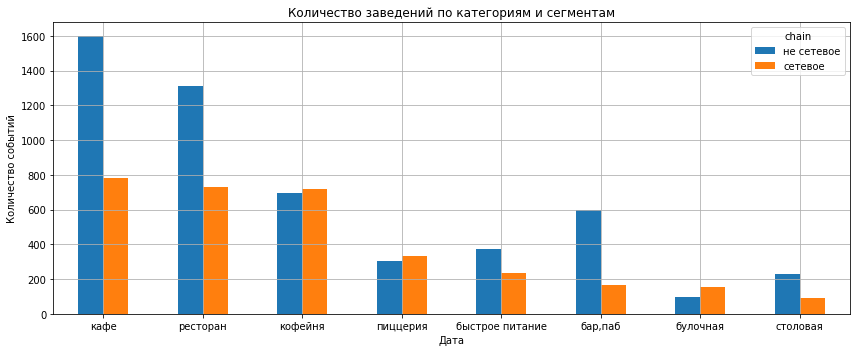

In [21]:
# визуализируем
category_by_chain_group.plot(kind='bar', grid=True, figsize=(12, 5))
plt.xticks(rotation=0)
plt.title('Количество заведений по категориям и сегментам')
plt.xlabel('Дата')
plt.ylabel('Количество событий')
plt.tight_layout()
plt.show()

In [22]:
# подсчитываем долю сетевых заведений каждой категории от общего количества подобных заведений
category_by_chain_group['share_chain'] = round((category_by_chain_group['сетевое'] / (category_by_chain_group['не сетевое'] \
                                                                                      +category_by_chain_group['сетевое'])) * 100, 1)
category_by_chain_group = category_by_chain_group.sort_values(by='share_chain', ascending=False)
display(category_by_chain_group)

chain,не сетевое,сетевое,share_chain
category,,,
булочная,99,157,61.3
пиццерия,303,330,52.1
кофейня,693,719,50.9
быстрое питание,371,232,38.5
ресторан,1312,729,35.7
кафе,1598,779,32.8
столовая,227,88,27.9
"бар,паб",596,168,22.0


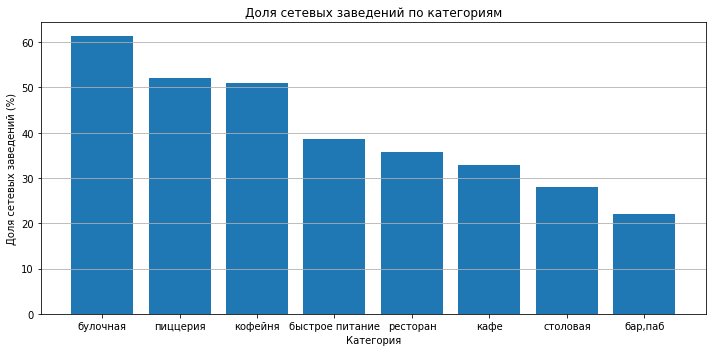

In [23]:
# визуализируем
category_by_chain_group = category_by_chain_group.reset_index()
plt.figure(figsize=(10, 5))
plt.bar(category_by_chain_group['category'], category_by_chain_group['share_chain'])
plt.xlabel('Категория')
plt.ylabel('Доля сетевых заведений (%)')
plt.title('Доля сетевых заведений по категориям')
plt.xticks(rotation=0)
plt.grid(axis='y')
plt.tight_layout()
plt.show()

Чаще всего сетевыми заведениями являются булочные (61.3% от их общего числа в датасете), чуть реже пиццерии и кофейни - 52.1% и 50.9% соответственно.\
Реже всего сетевыми являются бары и пабы - всего 22% из рассмотренного нами датасета.

#### Топ-15 популярных сетей в Москве

In [24]:
# группируем по названию сетей и подсчитываем количество заведений
chain_names = data.query('chain == "сетевое"')
chain_names = chain_names.groupby('name')['name'].count().sort_values(ascending=False)
chain_names = chain_names.head(15)
display(chain_names)

name
Шоколадница                            120
Домино'с Пицца                          76
Додо Пицца                              74
One Price Coffee                        71
Яндекс Лавка                            69
Cofix                                   65
Prime                                   50
Хинкальная                              44
КОФЕПОРТ                                42
Кулинарная лавка братьев Караваевых     39
Теремок                                 38
Чайхана                                 37
Буханка                                 32
CofeFest                                32
Му-Му                                   27
Name: name, dtype: int64

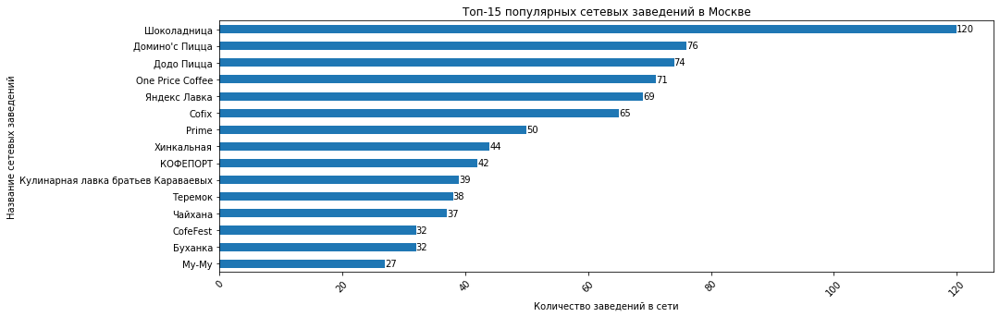

In [25]:
# визуализируем
chain_names = chain_names.sort_values()
ax = chain_names.plot(kind='barh', figsize=(15, 5))
plt.xticks(rotation=45)
for i in range(len(chain_names)):
    ax.text(chain_names.values[i], i, str(chain_names.values[i]), va='center')
plt.title('Топ-15 популярных сетевых заведений в Москве')
plt.xlabel('Количество заведений в сети')
plt.ylabel('Название сетевых заведений')
plt.show()

In [26]:
chain_names = chain_names.sort_values(ascending=False)

# выводим информацию о категориях этих заведений
c = data[data['name'].isin(chain_names.index)][['name', 'category']].drop_duplicates()
print(c)
print(c.groupby('category')['name'].count().sort_values(ascending=False))

                                     name         category
13                                Буханка         булочная
32                             Додо Пицца         пиццерия
34                         Домино'с Пицца         пиццерия
46                               CofeFest          кофейня
52                                  Cofix          кофейня
80                                  Му-Му             кафе
107                               Теремок         ресторан
109                               Чайхана             кафе
138                            Хинкальная  быстрое питание
143                      One Price Coffee          кофейня
151                           Шоколадница          кофейня
162                          Яндекс Лавка         ресторан
394                               Чайхана  быстрое питание
512                           Шоколадница             кафе
548                              КОФЕПОРТ          кофейня
872                               Буханка          кофей

Топ-15 сетевых заведений включает в себя: Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix, Prime, Хинкальная, КОФЕПОРТ, Кулинарная лавка братьев Караваевых, Теремок, Чайхана, Буханка, CofeFest, Му-Му.\
В них от 27 (Му-Му) до 120 (Шоколадница) заведений.\
Они в основном относятся к категории "кафе", "кофейня" и "ресторан", что соответствует общему распределению заведений по категориям.

Некоторые из этих сетей мне знакомы (например, Шоколадница, Додо Пицца, Кулинарная лавка братьев Караваевых, Чайхана).\
По моему мнению их объединяют сравнительно невысокая стоимость блюд и напитков и небольшие размеры.

#### Общее количество заведений и количество заведений каждой категории по районам

In [27]:
# группируем и подсчитываем общее количество заведений и количество заведений каждой категории по районам
# общее количество заведений по районам
total_district = data.groupby('district')['name'].count().sort_values(ascending=False).reset_index()
total_district.rename(columns={'name': 'total_count'}, inplace=True)
# количество заведений каждой категории по районам
category_district = data.groupby(['district', 'category'])['name'].count().sort_values(ascending=False).unstack()
display(total_district)
display(category_district)
# соединяем обе таблички
total_cat_district = total_district.set_index('district').join(category_district)
display(total_cat_district)

,district,total_count
0,Центральный административный округ,2241
1,Северный административный округ,898
2,Южный административный округ,892
3,Северо-Восточный административный округ,890
4,Западный административный округ,850
5,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
8,Северо-Западный административный округ,409


category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,53,25,71,272,105,72,160,40
Западный административный округ,50,37,62,238,150,71,218,24
Северный административный округ,68,39,58,235,192,77,188,41
Северо-Восточный административный округ,62,28,82,269,159,68,182,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,669,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,238,96,64,168,17
Южный административный округ,68,25,85,264,131,73,202,44


,total_count,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,,
Центральный административный округ,2241,364,50,87,464,428,113,669,66
Северный административный округ,898,68,39,58,235,192,77,188,41
Южный административный округ,892,68,25,85,264,131,73,202,44
Северо-Восточный административный округ,890,62,28,82,269,159,68,182,40
Западный административный округ,850,50,37,62,238,150,71,218,24
Восточный административный округ,798,53,25,71,272,105,72,160,40
Юго-Восточный административный округ,714,38,13,67,282,89,55,145,25
Юго-Западный административный округ,709,38,27,61,238,96,64,168,17
Северо-Западный административный округ,409,23,12,30,115,62,40,109,18


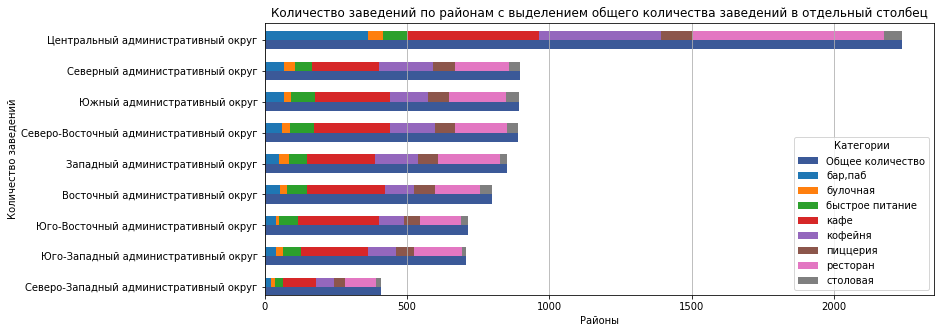

In [28]:
# визуализируем
total_cat_district = total_cat_district.sort_values('total_count')
# выделяем столбец с общим количеством заведений отдельно и отдельно остальные столбцы
separate_column = total_cat_district['total_count'] 
stacked_data = total_cat_district.drop(columns=['total_count']) 

# строим график
fig, ax = plt.subplots(figsize=(12, 5))

# отображаем отдельный столбец для total_count
separate_column.plot(kind='barh', ax=ax, position=1, width=0.3, label='Общее количество', color='#3B5998')

# отображаем остальные столбцы
stacked_data.plot(kind='barh', stacked=True, ax=ax, position=0, width=0.3)

# настраиваем график
plt.grid(axis='x')
ax.set_title('Количество заведений по районам с выделением общего количества заведений в отдельный столбец')
ax.set_xlabel('Районы')
ax.set_ylabel('Количество заведений')
ax.legend(title='Категории')
plt.show()

В датасете присутствует 9 административных округов.\
В порядке убывания общего количества заведений: Центральный(2241 заведений), Северный (898), Южный(892), Северо-Восточный(890), Западный (850), Восточный(798), Юго-Восточный(714), Юго-Западный(709), Северо-Западный(409).\
В Центральном а.о. находится больше всего заведений и по общему количеству, и по каждой категории.\
Значительная часть баров, пабов, кафе, кофейнь и ресторанов сосредоточена в Центральном административном округе, что объясняется высоким числом туристов и отдыхающих горожан.

#### Визуализизация распределения средних рейтингов по категориям заведений

In [29]:
# группируем и подсчитываем средние рейтинги заведений по категориям
avg_rating_cat = data.groupby('category')['rating'].mean().round(2).sort_values(ascending = False)
display(avg_rating_cat)

category
бар,паб            4.39
пиццерия           4.30
ресторан           4.29
кофейня            4.28
булочная           4.27
столовая           4.21
кафе               4.12
быстрое питание    4.05
Name: rating, dtype: float64

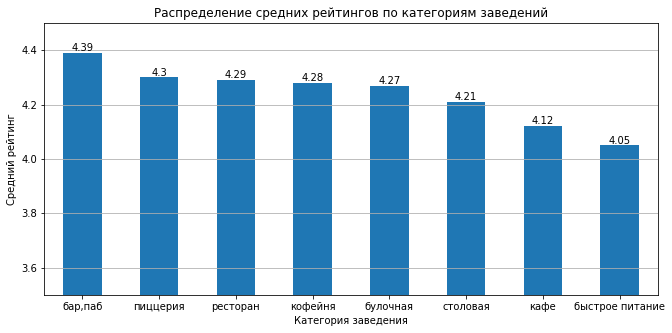

In [30]:
# визуализируем
avg_rating_cat.plot(kind='bar', figsize=(11, 5))
plt.xticks(rotation=0)
for index, value in enumerate(avg_rating_cat):
    plt.text(index, value, str(value), ha='center', va='bottom')
plt.grid(axis='y')    
plt.title('Распределение средних рейтингов по категориям заведений')
plt.xlabel('Категория заведения')
plt.ylabel('Средний рейтинг')
plt.ylim(3.5, 4.5)
plt.show()

Максимальный средний рейтинг в датасете у заведений категории "бар,паб" (4.39), минимальный - у заведений "быстрое питание" (4.05). Между ними разница заметна.\
При этом разница в средних рейтингах заведений категорий "пиццерия", "ресторан", "кофейня" и "булочная" почти незаметна - диапазон значений колеблется от 4.27 до 4.30.

#### Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [31]:
# группируем и подсчитываем средние рейтинги заведений по районам
avg_rating_dis = data.groupby('district')['rating'].mean().round(2).sort_values(ascending = False).reset_index()
display(avg_rating_dis)

,district,rating
0,Центральный административный округ,4.38
1,Северный административный округ,4.24
2,Северо-Западный административный округ,4.21
3,Западный административный округ,4.18
4,Южный административный округ,4.18
5,Восточный административный округ,4.17
6,Юго-Западный административный округ,4.17
7,Северо-Восточный административный округ,4.15
8,Юго-Восточный административный округ,4.10


In [32]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_rating_dis,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m)

tooltip = GeoJsonTooltip(
    fields=['name'],  # поля для отображения
    aliases=['Район:'],
    localize=True,
    sticky=True,
    to_minify=True
)

# добавим geojson с подписями
geo_json = GeoJson(
    state_geo,
    tooltip=tooltip,
).add_to(m)

# выводим карту
m

У заведений, расположенных в Центральном административном округе, наивысший рейтинг, составляющий 4.38.\
В то же время заведения, расположенные в Юго-Восточном административном округе, имеют наименьший рейтинг, который составляет 4.1.

#### Отображение всех заведений датасета на карте с помощью кластеров средствами библиотеки folium

In [33]:
# создаём карту Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles="Cartodb Positron")

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m1)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m1

По карте отчетливо видно, что основная масса заведений сконцентрирована в центре Москвы. Чуть меньше на севере и еще меньше на юге.

#### Топ-15 улиц по количеству заведений. График распределения количества заведений и их категорий по этим улицам

In [34]:
# группируем по названиям улиц и подсчитываем количество заведений
street_names = data.groupby('street')['name'].count().sort_values(ascending=False).reset_index()
street_names.rename(columns={'name': 'total_count'}, inplace=True)
street_names = street_names.head(15)
display(street_names)

,street,total_count
0,проспект Мира,183
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [35]:
# считаем количество заведений каждой категории по всем улицам
street_category = data.groupby(['street', 'category'])['name'].count().sort_values(ascending=False).unstack().fillna(0)
street_category = street_category.astype(int)
display(street_category.head())
# соединяем обе таблички
total_cat_street = street_names.set_index('street').join(street_category)
display(total_cat_street)

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
1-й Автозаводский проезд,0,0,0,1,0,0,0,0
1-й Балтийский переулок,0,0,0,0,0,0,1,0
1-й Варшавский проезд,0,0,0,1,0,0,0,0
1-й Вешняковский проезд,0,0,0,1,0,0,0,0
1-й Волоколамский проезд,0,0,0,1,1,0,1,0


,total_count,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,,
проспект Мира,183,11,4,21,53,36,11,45,2
Профсоюзная улица,122,6,4,15,35,18,15,26,3
проспект Вернадского,108,7,1,12,25,16,12,33,2
Ленинский проспект,107,10,3,2,26,23,5,33,5
Ленинградский проспект,95,15,4,2,12,25,9,25,3
Дмитровское шоссе,88,6,2,10,23,11,8,24,4
Каширское шоссе,77,2,0,10,20,16,5,19,5
Варшавское шоссе,76,6,0,7,18,14,4,20,7
Ленинградское шоссе,70,5,2,5,13,13,3,26,3


In [36]:
# удаляем столбец с общим количеством заведений на этих 15 улицах
total_cat_street = total_cat_street.drop(columns=['total_count'])

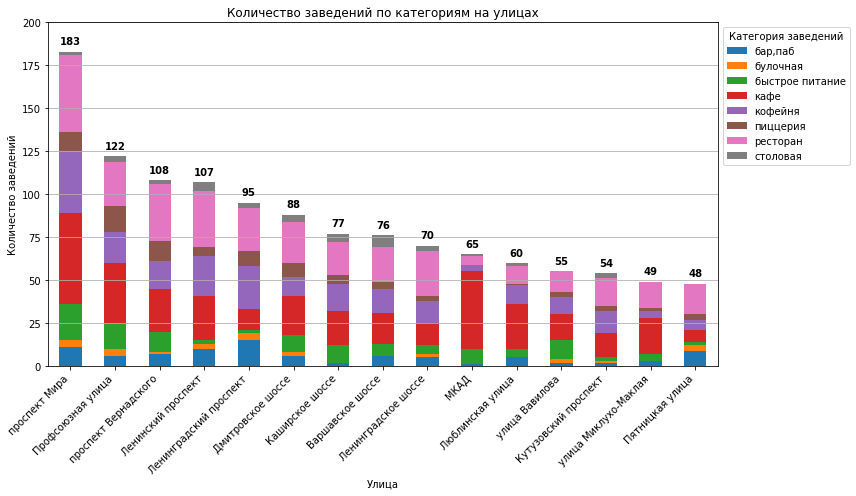

In [37]:
# визуализируем
ax = total_cat_street.plot(kind='bar', stacked=True, figsize=(12, 7))
plt.xticks(rotation=45, ha='right')
for i, total in enumerate(street_names['total_count']):
    ax.text(i, total + 3, str(total), ha='center', va='bottom', fontweight='bold') 
plt.title('Количество заведений по категориям на улицах')
plt.xlabel('Улица')
plt.ylabel('Количество заведений')
plt.legend(title='Категория заведений', bbox_to_anchor=(1, 1), loc='upper left')
plt.grid(axis='y')
plt.ylim(0, 200)
plt.tight_layout()       
plt.show()

В топ-15 улиц по количеству заведений входят: проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект, Дмитровское шоссе, Каширское шоссе, Варшавское шоссе, Ленинградское шоссе, МКАД, Люблинская улица, улица Вавилова, Кутузовский проспект, улица Миклухо-Маклая, Пятницкая улица.\
Больше всего заведений на проспекте Мира (183), среди которых преобладают рестораны (45), кафе(53) и кофейни(36).\
Меньше всего заведений из топа-15 на Пятницкой улице(48), из них преобладают рестораны(18 объектов).

#### Характеристика заведений на улицах, на которых находится только один объект общепита

In [38]:
# найдем улицы с одним заведением
one_object = data['street'].value_counts().reset_index()
one_object.columns = ['street', 'count']
one_object = one_object[one_object['count'] == 1]
display(one_object)

,street,count
990,Петровско-Разумовская аллея,1
991,Таёжная улица,1
992,улица Россолимо,1
993,улица Полины Осипенко,1
994,улица Паустовского,1
...,...,...
1443,Просторная улица,1
1444,Малый Кисловский переулок,1
1445,Тюменский проезд,1
1446,парк Технических видов спорта,1


In [39]:
#добавим всю информацию об этих улицах
streets1 = data[data['street'].isin(one_object['street'])]
display(streets1)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,clean_name,street,is_24_7
15,Дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,не сетевое,180.0,дом обеда,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,не сетевое,NaN,,Прибрежный проезд,False
25,В парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевое,NaN,в парке вкуснее,парк Левобережный,False
58,Coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,сетевое,NaN,coffeekaldis,Угличская улица,False
60,Чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,сетевое,NaN,чебуречная история,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8289,Мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,не сетевое,90.0,мираж,улица Шкулёва,False
8294,WTFcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,не сетевое,NaN,wtfcoffee,улица Артюхиной,False
8317,Беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,сетевое,NaN,беседка,Кузьминская улица,False
8379,Лагман Хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,сетевое,40.0,лагман хаус,Новороссийская улица,False


In [40]:
print(streets1.isna().sum())

name                   0
category               0
address                0
district               0
hours                 27
lat                    0
lng                    0
rating                 0
price                276
avg_bill             264
middle_avg_bill      293
middle_coffee_cup    434
chain                  0
seats                302
clean_name             0
street                 0
is_24_7                0
dtype: int64


Так как в получившейся таблице пропусков в стобцах с информацией о среднем чеке, средней стоимости чашки кофе и количестве посадочных мест больше половины, по этим пунктам проводить анализ будет не совсем корректно, поэтому мы выясним только следующие характеристики этих объектов:
* распределение по категориям
* распределение на сетевые и локальные заведения
* распределение по округам
* минимальный, максимальный и средний рейтинг
* распаределение на заведения с круглосуточным и ограниченным графиком работы

In [41]:
# группируем по категориям и подсчитываем количество заведений
streets1_cat = streets1.groupby('category')['name'].count().sort_values(ascending=False)
display(streets1_cat)

category
кафе               160
ресторан            93
кофейня             84
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: name, dtype: int64

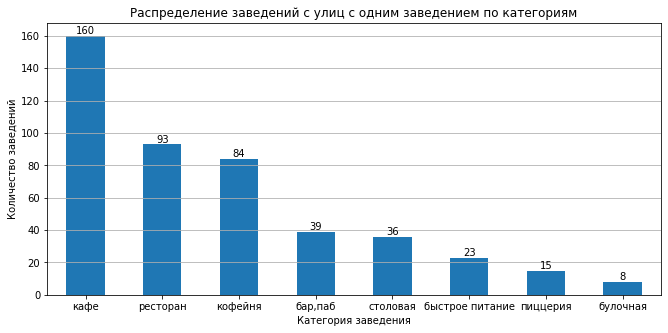

In [42]:
# визуализируем
streets1_cat.plot(kind='bar', figsize=(11, 5))
plt.xticks(rotation=0)
for index, value in enumerate(streets1_cat):
    plt.text(index, value, str(value), ha='center', va='bottom')
plt.grid(axis='y')    
plt.title('Распределение заведений с улиц с одним заведением по категориям')
plt.xlabel('Категория заведения')
plt.ylabel('Количество заведений')
plt.show()

In [43]:
# группируем и подсчитываем количество заведений, являющихся сетевыми и не сетевыми
display(streets1.groupby('chain')['name'].count().sort_values(ascending=False))

chain
не сетевое    325
сетевое       133
Name: name, dtype: int64

In [44]:
# группируем по округам и подсчитываем количество заведений 
streets1_dis = streets1.groupby('district')['name'].count().sort_values(ascending=False)
display(streets1_dis)

district
Центральный административный округ         145
Северо-Восточный административный округ     55
Восточный административный округ            52
Северный административный округ             52
Южный административный округ                43
Юго-Восточный административный округ        39
Западный административный округ             35
Северо-Западный административный округ      19
Юго-Западный административный округ         18
Name: name, dtype: int64

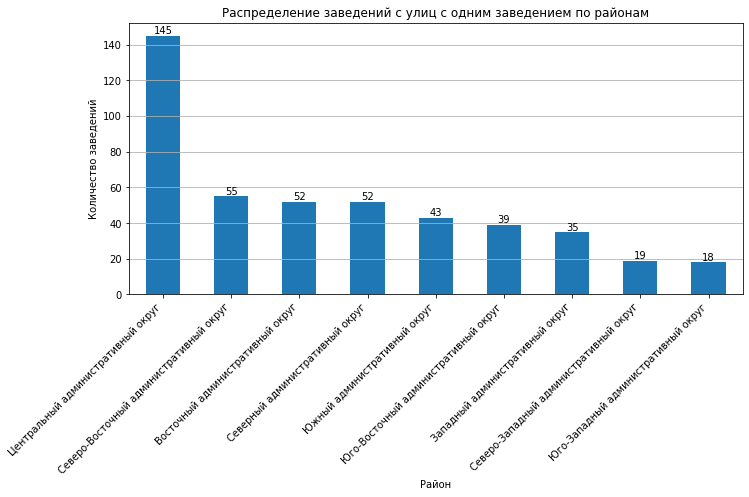

In [45]:
# визуализируем
streets1_dis.plot(kind='bar', figsize=(11, 5))
plt.xticks(rotation=45, ha='right')
for index, value in enumerate(streets1_dis):
    plt.text(index, value, str(value), ha='center', va='bottom')
plt.grid(axis='y')    
plt.title('Распределение заведений с улиц с одним заведением по районам')
plt.xlabel('Район')
plt.ylabel('Количество заведений')
plt.show()

In [46]:
# узнаем максимальный, минимальный и средний рейтинг этих заведений
print(f"Минимальный рейтинг: {streets1['rating'].min()}")
print(f"Максимальный рейтинг: {streets1['rating'].max()}")
print(f"Средний рейтинг: {round(streets1['rating'].mean(), 2)}")

Минимальный рейтинг: 1.0
Максимальный рейтинг: 5.0
Средний рейтинг: 4.24


In [47]:
# группируем по столбцу is_24_7 и подсчитываем количество заведений 
display(streets1.groupby('is_24_7')['name'].count().sort_values(ascending=False))

is_24_7
False    427
True      31
Name: name, dtype: int64

Улиц с одним заведением 458. Эти заведения характеризуются следующим:
* большая часть - кафе (160 объектов), а меньше всего булочных (8)
* больше половины не сетевые (325 объектов), сетевых лишь 133
* большая часть находится в Центральном административном округе (145), и меньше всего в Юго-Западном (18)
* минимальный рейтинг заведений: 1.0, максимальный: 5.0, средний: 4.24
* всего круглосуточных заведений — 31, некруглосуточных — 427

#### Фоновая картограмма (хороплет) с медианой значений средних чеков заведений для каждого района

In [48]:
# группируем по районам и рассчитываем медиану среднего чека
avg_bill_dist = data.groupby('district')['middle_avg_bill'].median().sort_values(ascending=False).reset_index()
display(avg_bill_dist)

,district,middle_avg_bill
0,Западный административный округ,1000.0
1,Центральный административный округ,1000.0
2,Северо-Западный административный округ,700.0
3,Северный административный округ,650.0
4,Юго-Западный административный округ,600.0
5,Восточный административный округ,575.0
6,Северо-Восточный административный округ,500.0
7,Южный административный округ,500.0
8,Юго-Восточный административный округ,450.0


In [49]:
# создаём карту Москвы
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10, tiles='Cartodb Positron')

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=avg_bill_dist,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Медианный рейтинг заведений по районам',
).add_to(m2)

# выводим карту
m2

Самый высокий средний чек у заведений Центрального и Западного административных округов (ок.1000 руб).\
Самый низкий - у Юго-Восточного (450 руб).\
Следовательно, цены в заведениях, расположенных ближе к центру Москвы и в более престижном Западном округе, выше, чем в более отдаленных районах.

#### Вывод

В датасете представлены заведения 8 следующих категорий: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая и булочная, из них больше всего заведений категории 'кафе' — 2377, а меньше всего булочных — всего 256 объектов.

Больше всего в среднем посадочных мест в заведениях категории "ресторан" - 86. Меньше всего - в булочных (50).

Больше всего заведений не сетевых - 5199 или 61.9% от общего количества, сетевых же 3202 (38.1%).

Чаще всего сетевыми заведениями являются булочные (61.3% от их общего числа в датасете), чуть реже пиццерии и кофейни - 52.1% и 50.9% соответственно. Реже всего сетевыми являются бары и пабы (всего 22%).

Топ-15 сетевых заведений включает в себя: Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix, Prime, Хинкальная, КОФЕПОРТ, Кулинарная лавка братьев Караваевых, Теремок, Чайхана, Буханка, CofeFest, Му-Му, в которых от 27 (Му-Му) до 120 (Шоколадница) заведений.\
Они в основном относятся к категории "кафе", "кофейня" и "ресторан", что соответствует общему распределению заведений по категориям.

В датасете присутствует 9 административных округов в порядке убывания общего количества заведений: Центральный(2241 заведений), Северный (898), Южный(892), Северо-Восточный(890), Западный (850), Восточный(798), Юго-Восточный(714), Юго-Западный(709), Северо-Западный(409).\
В Центральном а.о. находится больше всего заведений и по общему количеству, и по каждой категории.\
Значительная часть баров, пабов, кафе, кофеен и ресторанов сосредоточена в Центральном административном округе.

Максимальный средний рейтинг в датасете у заведений категории "бар,паб" (4.39), минимальный - у заведений "быстрое питание" (4.05). Между ними разница заметна.\
При этом разница в средних рейтингах заведений категорий "пиццерия", "ресторан", "кофейня" и "булочная" почти незаметна - диапазон значений колеблется от 4.27 до 4.30.

У заведений, расположенных в Центральном административном округе, наивысший рейтинг, составляющий 4.38.\
В то же время заведения, расположенные в Юго-Восточном административном округе, имеют наименьший рейтинг, который составляет 4.1.

Основная масса заведений сконцентрирована в центре Москвы. Чуть меньше на севере и еще меньше на юге.

В топ-15 улиц по количеству заведений входят: проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект, Дмитровское шоссе, Каширское шоссе, Варшавское шоссе, Ленинградское шоссе, МКАД, Люблинская улица, улица Вавилова, Кутузовский проспект, улица Миклухо-Маклая, Пятницкая улица.\
Больше всего заведений на проспекте Мира (183), среди которых преобладают рестораны (45), кафе(53) и кофейни(36).\
Меньше всего заведений из топа-15 на Пятницкой улице(48), из них преобладают рестораны(18 объектов).

Улиц с одним заведением 458. Эти заведения характеризуются следующим:
* большая часть - кафе (160 объектов), а меньше всего булочных (8)
* больше половины не сетевые (325 объектов), сетевых лишь 133
* большая часть находится в Центральном административном округе (145), и меньше всего в Юго-Западном (18)
* минимальный рейтинг заведений: 1.0, максимальный: 5.0, средний: 4.24
* всего круглосуточных заведений — 31, некруглосуточных — 427

Самый высокий средний чек у заведений Центрального и Западного административных округов (1000 руб).\
Самый низкий - у Юго-Восточного (450 руб).\
Следовательно, цены в заведениях, расположенных ближе к центру Москвы и в более престижном Западном округе, выше, чем в более отдаленных районах.

### Детализируем исследование: открытие кофейни

#### Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [50]:
# фильтруем кофейни в отдельный датафрейм и считаем их количество
coffee_houses = data.query('category == "кофейня"')
print(f'В датасете: {coffee_houses["category"].count()} кофеен')

В датасете: 1412 кофеен


In [51]:
# группируем по районам и считаем количество кофеен в них
coffee_houses_dis = coffee_houses.groupby('district')['name'].count().sort_values(ascending=False).reset_index()
coffee_houses_dis = coffee_houses_dis.rename(columns={'name': 'count'})
display(coffee_houses_dis)

,district,count
0,Центральный административный округ,428
1,Северный административный округ,192
2,Северо-Восточный административный округ,159
3,Западный административный округ,150
4,Южный административный округ,131
5,Восточный административный округ,105
6,Юго-Западный административный округ,96
7,Юго-Восточный административный округ,89
8,Северо-Западный административный округ,62


In [52]:
# подготовим к визуализации
# перебирем значения в столбце 'district' и заменим 'административный округ' на 'а. о.'
for index, row in coffee_houses_dis.iterrows():
    coffee_houses_dis.at[index, 'district'] = row['district'].replace('административный округ', 'а. о.')
display(coffee_houses_dis)

,district,count
0,Центральный а. о.,428
1,Северный а. о.,192
2,Северо-Восточный а. о.,159
3,Западный а. о.,150
4,Южный а. о.,131
5,Восточный а. о.,105
6,Юго-Западный а. о.,96
7,Юго-Восточный а. о.,89
8,Северо-Западный а. о.,62


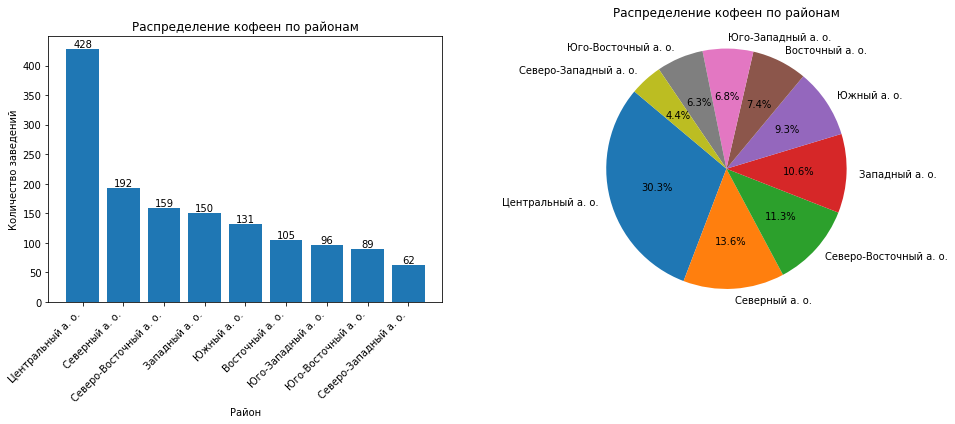

In [53]:
# визуализируем
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 6))

ax1.bar(coffee_houses_dis['district'], coffee_houses_dis['count'])

for index, value in enumerate(coffee_houses_dis['count']):
    ax1.text(index, value, str(value), ha='center', va='bottom')
ax1.set_title('Распределение кофеен по районам')
ax1.set_xlabel('Район')
ax1.set_ylabel('Количество заведений')
ax1.set_xticks(range(len(coffee_houses_dis['district']))) 
ax1.set_xticklabels(coffee_houses_dis['district'], rotation=45, ha='right')

# создаем круговую диаграмму
ax2.pie(coffee_houses_dis['count'], labels=coffee_houses_dis['district'], autopct='%1.1f%%', startangle=140)
ax2.set_title('Распределение кофеен по районам', pad=20)
ax2.axis('equal')

plt.tight_layout()
plt.show()

В датасете 1412 кофеен.\
Основная доля расположена в Центральном а. о. (428 объектов или 30.3% от их общего количества). В других районах их намного меньше - от 62 объектов в Северо-Западном а. о.(4.4%) до 192 в Северном (13.6%).

#### Есть ли круглосуточные кофейни?

In [54]:
# считаем, сколько круглосуточных и некруглосуточных кофеен в общем
coffee_houses_24_7 = coffee_houses.groupby('is_24_7')['name'].count().sort_values(ascending=False)
coffee_houses_24_7.rename(index={False: 'не круглосуточные', True: 'круглосуточные'}, inplace=True)
display(coffee_houses_24_7)

# считаем, сколько круглосуточных и некруглосуточных кофеен по районам
coffee_houses_24_7_dis = coffee_houses.pivot_table(
    index='district',
    columns='is_24_7',
    values='name',
    aggfunc='count',
    fill_value=0
).reset_index()
coffee_houses_24_7_dis = coffee_houses_24_7_dis.sort_values(by=True, ascending=False).set_index('district')

display(coffee_houses_24_7_dis)

is_24_7
не круглосуточные    1353
круглосуточные         59
Name: name, dtype: int64

is_24_7,False,True
district,,
Центральный административный округ,402,26
Западный административный округ,141,9
Юго-Западный административный округ,89,7
Восточный административный округ,100,5
Северный административный округ,187,5
Северо-Восточный административный округ,156,3
Северо-Западный административный округ,60,2
Юго-Восточный административный округ,88,1
Южный административный округ,130,1


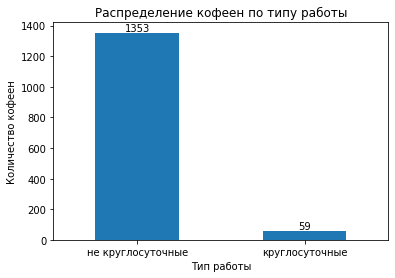

In [55]:
# визуализируем распредление кофеен по типу работы в общем
coffee_houses_24_7.plot(kind='bar', figsize=(6, 4))
plt.xticks(rotation=0)
for index, value in enumerate(coffee_houses_24_7):
    plt.text(index, value, str(value), ha='center', va='bottom')
plt.title('Распределение кофеен по типу работы')
plt.xlabel('Тип работы')
plt.ylabel('Количество кофеен')
plt.show()

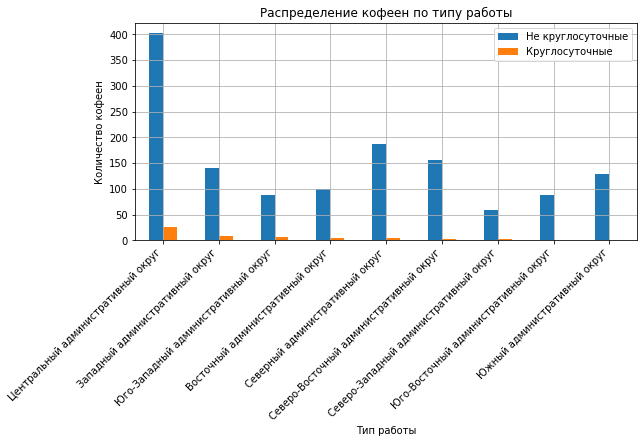

In [56]:
# создаем второй столбчатый график с распределением кофеен на круглосуточные и некруглосуточные по округам
coffee_houses_24_7_dis.plot(kind='bar', grid=True, figsize=(9, 4))
plt.xticks(rotation=45, ha='right')
plt.title('Распределение кофеен по типу работы')
plt.xlabel('Тип работы')
plt.ylabel('Количество кофеен')
plt.legend(['Не круглосуточные', 'Круглосуточные'])
plt.show()

Круглосуточных кофеен в датасете всего 59.\
Больше всего таких заведений в Центральном административном округе (26), меньше всего в Южном и Юго-Восточном (по 1).

#### Какие у кофеен рейтинги? Как они распределяются по районам?

In [57]:
print(f"Минимальный рейтинг у кофеен: {coffee_houses['rating'].min()}")
print(f"Максимальный рейтинг у кофеен: {coffee_houses['rating'].max()}")
print(f"Средний рейтинг у кофеен: {coffee_houses['rating'].mean().round(2)}")

Минимальный рейтинг у кофеен: 1.4
Максимальный рейтинг у кофеен: 5.0
Средний рейтинг у кофеен: 4.28


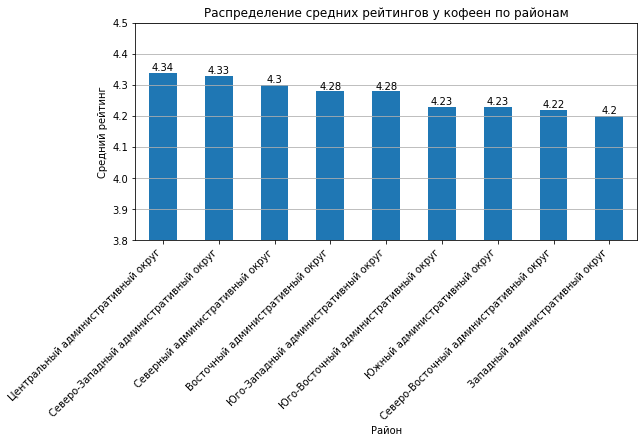

In [58]:
# смотрим распредление средних рейтингов у кофеен по районам
avg_rating_cof_house = coffee_houses.groupby('district')['rating'].mean().round(2).sort_values(ascending = False)

# визуализируем
avg_rating_cof_house.plot(kind='bar', figsize=(9, 4))
plt.xticks(rotation=45, ha='right')
for index, value in enumerate(avg_rating_cof_house):
    plt.text(index, value, str(value), ha='center', va='bottom')
plt.grid(axis='y')
plt.title('Распределение средних рейтингов у кофеен по районам')
plt.xlabel('Район')
plt.ylabel('Средний рейтинг')
plt.ylim(3.8, 4.5)
plt.show()

Минимальный рейтинг у кофеен: 1.4.\
Максимальный рейтинг у кофеен: 5.0.\
Средний рейтинг у кофеен: 4.28.

Самый высокий средний рейтинг у кофеен в Центральном а.о. (4.34), самый низкий - в Западном (4.2).

#### На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

In [59]:
print(coffee_houses['middle_coffee_cup'].isna().sum())

891


*Заметка:*\
так как в датасете больше, чем у половины кофеен отсутствует информация о средней стоимости чашки капучино, будет не совсем корректно ориентироваться на эти данные при окончательном решении.

In [60]:
print(f"Минимальная стоимость чашки капучино: {coffee_houses['middle_coffee_cup'].min()}")
print(f"Максимальная стоимость чашки капучино: {coffee_houses['middle_coffee_cup'].max()}")
print(f"Средняя стоимость чашки капучино: {coffee_houses['middle_coffee_cup'].median()}")

Минимальная стоимость чашки капучино: 60.0
Максимальная стоимость чашки капучино: 1568.0
Средняя стоимость чашки капучино: 170.0


In [61]:
coffee_houses['middle_coffee_cup'].describe()

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

У более чем 75% кофеен стоимость чашки капучино превышает 124 рубля.\
При этом только у 25% она превышает 225 рублей.

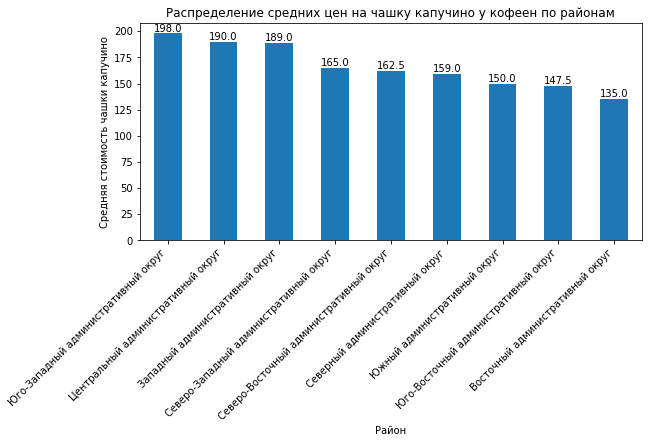

In [62]:
# смотрим распредление средних цен на чашку капучино у кофеен по районам
avg_coffee_cup = coffee_houses.groupby('district')['middle_coffee_cup'].median().round(2).sort_values(ascending = False)

# визуализируем
avg_coffee_cup.plot(kind='bar', figsize=(9, 4))
plt.xticks(rotation=45, ha='right')
for index, value in enumerate(avg_coffee_cup):
    plt.text(index, value, str(value), ha='center', va='bottom')
plt.title('Распределение средних цен на чашку капучино у кофеен по районам')
plt.xlabel('Район')
plt.ylabel('Средняя стоимость чашки капучино')
plt.show()

Минимальная стоимость чашки капучино: 60.0.\
Максимальная стоимость чашки капучино: 1568.0.\
Средняя стоимость чашки капучино: 170.0.\
У более чем 75% кофеен стоимость чашки капучино превышает 124 рубля.\
При этом только у 25% она превышает 225 рублей.

Самая высокая средняя стоимость чашки капучино в кофейнях в Юго-Западном а.о.(198 руб), в Центральном и Западном она чуть ниже - 190 и 189 рублей соответственно.\
Самая дешевая чашка капучино в кофейнях Восточного а.о., и она в среднем стоит 135 рублей.

#### Заключение по исследованию перспективности открытия кофейни

Исследование проводилось на основе данных о 1412 кофейнях Москвы.

Основная доля кофеен расположена в Центральном а. о. (428 объектов или 30.3% от их общего количества). В других районах их намного меньше - от 62 объектов в Северо-Западном а. о.(4.4%) до 192 в Северном (13.6%).

Круглосуточных кофеен из исследованных всего 59, большая часть которых находится в Центральном административном округе (26), а меньше всего их в Южном и Юго-Восточном (по 1).

Минимальный рейтинг у кофеен - 1.4, максимальный - 5.0, средний - 4.28.\
Самый высокий средний рейтинг у кофеен в Центральном а.о. (4.34), самый низкий - в Западном (4.2).

Минимальная стоимость чашки капучино - 60 рублей, максимальная - 1568, средняя - 170.\
При этом у более чем 75% кофеен стоимость чашки капучино превышает 124 рубля, и только у 25% она превышает 225 рублей.\
Самая высокая средняя стоимость чашки капучино в кофейнях в Юго-Западном а.о.(198 руб), в Центральном и Западном она чуть ниже - 190 и 189 рублей соответственно, а самая дешевая чашка капучино в кофейнях Восточного а.о., и она в среднем стоит 135 рублей.

#### Возможная рекомендация на основе проведенного исследования

Рекомендуется выбрать для открытия кофейни Западный или Юго-Западный округа (в нем конкуренция чуть ниже), так как здесь и заведений такого типа не особо много (150 и 96 соответственно), и средняя стоимость кофе выше, чем в других районах. Это позволит при тех же затратах на сырье получать большую выручку. Также с этой же точки зрения можно было бы рассмотреть Центральный округ, однако там расположено слишком много кофеен, что создает очень высокую конкуренцию.\
Стоимость чашки капучино рекомендуется установить на уровне 170 рублей, что соответствует средней стоимости по городу, но при этом является ниже средней стоимости в этих округах, что привлечет больше клиентов в первое время, а это особо важно для рекламы и заработка рейтинга, который стоит поддерживать на уровне около 4.3, который будет выше среднего рейтинга и по городу, и по этим районам.\
Также стоит рассмотреть возможность круглосуточной работы, так как в Западном и Юго-Западном округах круглосуточных кофеен очень мало (9 и 7 соответственно), также такой тип работы будет востребован в Центральном округе, так как в ночное время суток здесь гуляет много людей.

### Итоговый вывод

Презентация: https://disk.yandex.ru/i/TcukyyRq-w17TA

**Исследование проводилось на основе:** \
Данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года о заведениях общественного питания Москвы.
<br>
<br>

**Задача была следующая:**\
Подготовить исследование рынка заведений общественного питания Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
<br>
<br>

**На этапе предобработки:**
1. Явных дубликатов обнаружено не было.
2. Были удалены неявные строки-дубликаты, где совпадают название и адрес (0.06% данных).
3. Пропуски были обнаружены в столбцах: hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, seats. Мы оставили их без обработки.
4. Создали столбец street с названиями улиц из столбца с адресом.
5. Создали столбец is_24_7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7).
<br>
<br>

**На этапе исследовательского анализа данных было выяснено следующее:**
1. Заведения в датасете делятся на 8 следующих категорий: кафе, ресторан, кофейня, бар/паб, пиццерия, быстрое питание, столовая и булочная, из них больше всего заведений категории 'кафе' — 2377, а меньше всего булочных — всего 256 объектов.
<br>

2. Больше всего в среднем посадочных мест в заведениях категории "ресторан" - 86. Меньше всего - в булочных (50).
<br>

3. Больше всего заведений не сетевых - 5199 или 61.9% от общего количества, сетевых же 3202 (38.1%).
<br>

4. Чаще всего сетевыми заведениями являются булочные (61.3% от их общего числа в датасете), чуть реже пиццерии и кофейни - 52.1% и 50.9% соответственно. Реже всего сетевыми являются бары и пабы (всего 22%).
<br>

5. Топ-15 сетевых заведений включает в себя: Шоколадница, Домино'с Пицца, Додо Пицца, One Price Coffee, Яндекс Лавка, Cofix, Prime, Хинкальная, КОФЕПОРТ, Кулинарная лавка братьев Караваевых, Теремок, Чайхана, Буханка, CofeFest, Му-Му, в которых от 27 (Му-Му) до 120 (Шоколадница) заведений. Они в основном относятся к категории "кафе", "кофейня" и "ресторан".
<br>

6. В датасете присутствует 9 административных округов в порядке убывания общего количества заведений: Центральный(2241 заведений), Северный (898), Южный(892), Северо-Восточный(890), Западный (850), Восточный(798), Юго-Восточный(714), Юго-Западный(709), Северо-Западный(409). В Центральном а.о. находится больше всего заведений и по общему количеству, и по каждой категории. Значительная часть баров, пабов, кафе, кофеен и ресторанов сосредоточена в Центральном административном округе.
<br>

7. Максимальный средний рейтинг в датасете у заведений категории "бар,паб" (4.39), минимальный - у заведений "быстрое питание" (4.05). Между ними разница заметна. При этом разница в средних рейтингах заведений категорий "пиццерия", "ресторан", "кофейня" и "булочная" почти незаметна - диапазон значений колеблется от 4.27 до 4.30.
<br>

8. У заведений, расположенных в Центральном административном округе, наивысший рейтинг, составляющий 4.38. В то же время заведения, расположенные в Юго-Восточном административном округе, имеют наименьший рейтинг, который составляет 4.1.
<br>

9. Основная масса заведений сконцентрирована в центре Москвы. Чуть меньше на севере и еще меньше на юге.
<br>

10. В топ-15 улиц по количеству заведений входят: проспект Мира, Профсоюзная улица, проспект Вернадского, Ленинский проспект, Ленинградский проспект, Дмитровское шоссе, Каширское шоссе, Варшавское шоссе, Ленинградское шоссе, МКАД, Люблинская улица, улица Вавилова, Кутузовский проспект, улица Миклухо-Маклая, Пятницкая улица. Больше всего заведений на проспекте Мира (183), среди которых преобладают рестораны (45), кафе(53) и кофейни(36). Меньше всего заведений из топа-15 на Пятницкой улице(48), из них преобладают рестораны(18 объектов).
<br>

11. Улиц с одним заведением 458. Эти заведения характеризуются следующим:
* большая часть - кафе (160 объектов), а меньше всего булочных (8)
* больше половины не сетевые (325 объектов), сетевых лишь 133
* большая часть находится в Центральном административном округе (145), и меньше всего в Юго-Западном (18)
* минимальный рейтинг заведений: 1.0, максимальный: 5.0, средний: 4.24
* всего круглосуточных заведений — 31, некруглосуточных — 427
<br>

12. Самый высокий средний чек у заведений Центрального и Западного административных округов (1000 руб). Самый низкий - у Юго-Восточного (450 руб). Следовательно, цены в заведениях, расположенных ближе к центру Москвы и в более престижном Западном округе, выше, чем в более отдаленных районах.
<br>
<br>

**Заключение по исследованию перспективности открытия кофейни:**
1. Исследование проводилось на основе данных о 1412 кофейнях Москвы.
2. Основная доля кофеен расположена в Центральном а. о. (428 объектов или 30.3% от их общего количества). В других районах их намного меньше - от 62 объектов в Северо-Западном а. о.(4.4%) до 192 в Северном (13.6%).
3. Круглосуточных кофеен из исследованных всего 59, большая часть которых находится в Центральном административном округе (26), а меньше всего их в Южном и Юго-Восточном (по 1).
4. Минимальный рейтинг у кофеен - 1.4, максимальный - 5.0, средний - 4.28.
5. Самый высокий средний рейтинг у кофеен в Центральном а.о. (4.34), самый низкий - в Западном (4.2).
6. Минимальная стоимость чашки капучино - 60 рублей, максимальная - 1568, средняя - 170.
7. У более чем 75% кофеен стоимость чашки капучино превышает 124 рубля, и только у 25% она превышает 225 рублей. 
8. Самая высокая средняя стоимость чашки капучино в кофейнях в Юго-Западном а.о.(198 руб), в Центральном и Западном она чуть ниже - 190 и 189 рублей соответственно, а самая дешевая чашка капучино в кофейнях Восточного а.о., и она в среднем стоит 135 рублей.
<br>
<br>

**Возможная рекомендация на основе проведенного исследования:**\
Рекомендуется выбрать для открытия кофейни Западный или Юго-Западный округа (в нем конкуренция чуть ниже), так как здесь и заведений такого типа не особо много (150 и 96 соответственно), и средняя стоимость кофе выше, чем в других районах. Это позволит при тех же затратах на сырье получать большую выручку. Также с этой же точки зрения можно было бы рассмотреть Центральный округ, однако там расположено слишком много кофеен, что создает очень высокую конкуренцию.

Стоимость чашки капучино рекомендуется установить на уровне 170 рублей, что соответствует средней стоимости по городу, но при этом является ниже средней стоимости в этих округах, что привлечет больше клиентов в первое время, а это особо важно для рекламы и заработка рейтинга, который стоит поддерживать на уровне около 4.3, который будет выше среднего рейтинга и по городу, и по этим районам.

Также стоит рассмотреть возможность круглосуточной работы, так как в Западном и Юго-Западном округах круглосуточных кофеен очень мало (9 и 7 соответственно), также такой тип работы будет востребован в Центральном округе, так как в ночное время суток здесь гуляет много людей.